# Install/import packages

In [ ]:
%pip install pandas
%pip install geopandas
%pip install numpy
%pip install shapely
%pip install pyogrio
%pip install pyproj
%pip install packaging
%pip install matplotlib
%pip install mapclassify
%pip install folium
%pip install overpy
%pip install io
%pip install sklearn
%pip install libpysal

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import shapely.geometry as shp
import pyogrio
import pyproj
import packaging
import matplotlib
import mapclassify
import folium
import matplotlib.pyplot as plt
from shapely.geometry import Point
import os
import io
import overpy
import sklearn
import sklearn.cluster as skc
from sklearn.cluster import DBSCAN # version: 0.24.1
from collections import Counter
import libpysal as lp
import sklearn.metrics as skm
import warnings

%matplotlib inline
pd.set_option('display.max_rows', 50)
warnings.filterwarnings('ignore')

# Plot bike theft reports


In [2]:
# Import thefts csv with all bike thefts since 2015 to July 2025
allthefts = pd.read_csv('geodata/bikescootertheft_2015to2025.csv')

# Drop rows without lat/lon
allthefts.dropna(subset=['Lat'], inplace=True)

# Format as geodataframe
allthefts = gpd.GeoDataFrame(allthefts, geometry=gpd.points_from_xy(allthefts['Long'], allthefts['Lat']), crs="EPSG:4326")

In [3]:
# subset bike thefts (since 2023 and since 2015)
btheft_since2023 = allthefts[(allthefts["YEAR"]>2022) & (allthefts["OFFENSE_CODE"]==616)]
btheft_all = allthefts[allthefts["OFFENSE_CODE"]==616]

#view points
btheft_all.explore(
    color="red",  
    marker_kwds=dict(radius=1, fill=True), 
    tooltip=["INCIDENT_NUMBER","OFFENSE_DESCRIPTION", "OCCURRED_ON_DATE", "STREET"],  
)

# Get point counts for boston neighborhood polygons

In [4]:
# Import thefts csv with all bike thefts since 2015 to July 2025
thefts23 = pd.read_csv('geodata/newdata.csv')

# Drop rows without lat/lon
thefts23 = thefts23.drop(thefts23[thefts23.offense_location_latitude == '<Null>'].index)
# Format as geodataframe
thefts23 = gpd.GeoDataFrame(thefts23, geometry=gpd.points_from_xy(thefts23['offense_location_longitude'], thefts23['offense_location_latitude']), crs="EPSG:4326")

#view points
thefts23.explore(
    color="red",  
    marker_kwds=dict(radius=1, fill=True), 
    tooltip=["report_date","offense_location_full_address"],  
)

In [ ]:
from folium.plugins import FastMarkerCluster
bos = folium.Map(location=[42.345, -71.065], zoom_start=13)
FastMarkerCluster(data=list(zip(allthefts['offense_location_latitude'], thefts23['offense_location_longitude']))).add_to(bos)
folium.LayerControl().add_to(bos);

bos

In [23]:
# import boston neighborhood polygons
bos_hoods = gpd.read_file('geodata/boston_nhoods_noislands.json')
cam_som = gpd.read_file('geodata/cambridge_somerville.json')
cam_som['name'] = cam_som['TOWN']
cam_som['name'][0] = cam_som['name'][0].title()
cam_som['name'][1] = cam_som['name'][1].title()
hoods = pd.concat([bos_hoods,cam_som], ignore_index=True)

hoods.to_file("geodata/boston_som_camb.geojson", driver='GeoJSON')

In [29]:
# spatial join w/ neighborhoods & bike theft points
#sjoin = gpd.sjoin(left_df=bos_hoods,right_df=btheft_all,how='left')

# use groupby to get number of points in each neighborhood
#counts = sjoin.groupby('name')['INCIDENT_NUMBER'].count().rename('num_pts').reset_index()

# make a csv with counts
#counts.to_csv("geodata/btheft_all_bhoods.csv")

# repeat for btheft_since2023 
sjoin = gpd.sjoin(left_df=hoods,right_df=thefts23,how='left')
counts = sjoin.groupby('name')['Incident_Number'].count().rename('num_pts').reset_index()
counts.to_csv("geodata/thefts23_nhoods.csv")

In [30]:
counts

,name,num_pts
0,Allston,87
1,Back Bay,189
2,Bay Village,4
3,Beacon Hill,40
4,Brighton,54
5,Cambridge,0
6,Charlestown,35
7,Chinatown,23
8,Dorchester,145
9,Downtown,184


# Use DBSCAN to get hotspots (point clusters)

In [16]:
# Function to use DBSCAN and return hot spots
# DBSCAN docs : https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

def get_hotspots(gdf, eps_val, minpts):

    # NAD83 / Massachusetts Mainland - EPSG:26986 (Convert projection to meters)
    gdf = gdf.to_crs(epsg=26986)

    # Run the DBSCAN algorithm to locate clusters based on parameters
    data = np.array([gdf.geometry.x.values, gdf.geometry.y.values]).T
    dbscan = DBSCAN(eps=eps_val, min_samples=minpts)
    dbscan.fit(data)

    # Add label (cluster ID) to each point in the gdf
    ### Noise is labeled -1; everything else gets a positive integer
    labels = dbscan.labels_
    gdf['cluster'] = labels

    # Print a msg that states the number of clusters found (noise removed)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    print("Estimated number of clusters: %d" % n_clusters)

    # Make a DF where one central point represents each cluster (hot spots)
    ### If reusing this script --> Replace "OFFENSE_DESCRIPTION" with another column name in the gdf
    hot_spots = gdf.dissolve(by="cluster",aggfunc={"OFFENSE_DESCRIPTION":"count"},as_index=False).drop([0])     #Dissolve clusters into multipoint geometries
    hot_spots['centerpoint'] = hot_spots.centroid   #Calculate centerpoint for each multipoint cluster
    hot_spots.rename(columns={'OFFENSE_DESCRIPTION': 'count'}, inplace=True)
    hot_spots.set_geometry('centerpoint', inplace=True)     # Set centroid as default geometry
    hot_spots.drop(['geometry'], axis=1, inplace=True)
    hot_spots['radius'] = hot_spots['centerpoint'].buffer(eps_val)
    hot_spots['radius'] = hot_spots['radius'].to_crs(epsg=4326)
    hot_spots.sort_values(by=['count'],ascending=False,inplace=True,ignore_index=True)  # Sort the gdf by count (largest clusters first)


    # Plot original gdf with clusters highlighted in diff colors
    gdf.plot(column='cluster', categorical=True, markersize=5)

    # Convert gdf back to web mapping CRS (4326)
    gdf = gdf.to_crs(epsg=4326)
    hot_spots = hot_spots.to_crs(epsg=4326)
    return gdf, hot_spots

Estimated number of clusters: 65


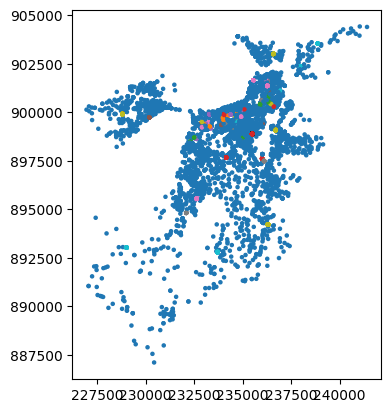

In [55]:
# Subset scooter and bike thefts into diff gdfs
#sthefts = allthefts[(allthefts['OFFENSE_CODE']==706)]
bthefts = allthefts[(allthefts['OFFENSE_CODE']==616)]

# HOW TO RUN THE FUNCTION
# gdf1 = Returns OG gdf with cluster IDs
# gdf2 = Returns gdf with only the hotspots (cluster centerpoints)
# eps_val = maximum distance between points (in metres)
# minpts = minimum number of points in a cluster

# gdf1, gdf2 = get_hotspots(gdf, eps_val, minpts)

bike_clust, bhotspots = get_hotspots(bthefts,48.768,10)
#scoot_clust, shotspots = get_hotspots(sthefts,50,5)

# Mapping the clusters

In [57]:
# Generate blank boston basemap
bos = folium.Map(location=[42.345, -71.065], zoom_start=13)

# Read in police station locations
bpd_stations = gpd.read_file('geodata/boston_police_stations_bpd_only/boston_police_stations_bpd_only.shp')

In [58]:
# Map hot spots with bpd locations to see which clusters overlap

bhotspots.explore(
    m=bos,
    column="count",  # use red color on all points
    cmap='plasma',
    marker_kwds=dict(radius=20, fill=True),  # make marker radius 10px with fill
)

bpd_stations.explore(
    m=bos,
    color="black",
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    )

In [59]:
# Note the clusters on top of police stations (need to redo this after changing function parameters - should be 11 total):
overlap = [56,58,59,39,57,19,55,24,43,52,64]

# Remove the points that overlap with bpd (dont need to change anything below, only the list above)
bhotspots = bhotspots.loc[
    (bhotspots['cluster']!=overlap[0]) & 
    (bhotspots['cluster']!=overlap[1]) & 
    (bhotspots['cluster']!=overlap[2]) & 
    (bhotspots['cluster']!=overlap[3]) & 
    (bhotspots['cluster']!=overlap[4]) &
    (bhotspots['cluster']!=overlap[5]) &
    (bhotspots['cluster']!=overlap[6]) &
    (bhotspots['cluster']!=overlap[7]) &
    (bhotspots['cluster']!=overlap[8]) &
    (bhotspots['cluster']!=overlap[9]) &
    (bhotspots['cluster']!=overlap[10]) 
    ]

In [60]:
# Get lat/longs
bhotspots['lat'] = bhotspots.centerpoint.y
bhotspots['lng'] = bhotspots.centerpoint.x

# Sort by count again
bhotspots.sort_values(by=['count'],ascending=False,inplace=True,ignore_index=True)

# Subset top 10
bhotspots_top10 = bhotspots[:10]

In [65]:
# This part is just for styling the markers for a DW locator map

# Defining functions to style classes
def style_classes(count, style_list):
    if count <= 10:
        return style_list[0]
    elif 10 < count <= 12:
        return style_list[1]
    elif 12 < count <= 15:
        return style_list[2]
    elif 15 < count <= 25:
        return style_list[3]
    elif 25 < count <= 42:
        return style_list[4]
    elif count > 42:
        return style_list[5]
    
def style_top10(count, style_list):
    if count <= 25:
        return style_list[0]
    elif 25 < count <= 30:
        return style_list[1]
    elif 30 < count <= 35:
        return style_list[2]
    elif 35 < count <= 40:
        return style_list[3]
    elif 40 < count <= 55:
        return style_list[4]
    elif count > 55:
        return style_list[5]
    
#colors = ['#e9a499','#d98273','#c8614e','#b74836','#a73a29','#972c1b']
blue = ['#008bee','#008bee','#008bee','#008bee','#008bee','#008bee']
labels = [' hot spot</big></b><br><i>Corner of Winter St. and Winter Place (Downtown Crossing)</i><br><br><b>',
          ' hot spot</big></b><br><i>Boylston St. between Gloucester St. and Fairfield St. (Back Bay)</i><br><br><b>',
          ' hot spot</big></b><br><i>Corner of Washington St. and Milk St. (Downtown)</i><br><br><b>',
          ' hot spot</big></b><br><i>Park Drive outside Landmark Center (Fenway)</i><br><br><b>',
          ' hot spot</big></b><br><i>Newbury St. between Mass Ave. and Herefore St. (Back Bay)</i><br><br><b>',
          ' hot spot</big></b><br><i>Brookline Ave. outside Landmark Center (Fenway)</i><br><br><b>',
          ' hot spot</big></b><br><i>Boylston St. outside Boston Public Library (Back Bay)</i><br><br><b>',
          ' hot spot</big></b><br><i>Boylston St. between Kilmarnock St. and Richard B. Ross Way (Fenway)</i><br><br><b>',
          ' hot spot</big></b><br><i>Boylston St. between Jersey St. and Ipswich St. (Fenway)</i><br><br><b>',
          ' hot spot</big></b><br><i>Corner of Mass Ave. and Belvidere St., next to Berklee College of Music (Back Bay)</i><br><br><b>']

bhotspots_top10['labels'] = labels

bhotspots_top10['color'] = bhotspots_top10['count'].apply(lambda x: style_top10(x, blue))
bhotspots_top10['marker-size'] = 'medium'
    #bhotspots['marker-size'] = bhotspots['count'].apply(lambda x: x * 0.1) ## if you want to size markers by count ##
bhotspots_top10['name'] = ' '
bhotspots_top10['icon'] = 'locator'
bhotspots_top10['marker-symbol'] = bhotspots_top10.index + 1
bhotspots_top10['tooltip'] = (
    '<b><big>#' + 
    bhotspots_top10['marker-symbol'].astype(str) +
    bhotspots_top10.labels + 
    bhotspots_top10['count'].astype(str) + 
    '</b> bikes reported stolen from here since 2015'
)

In [66]:
top10_pts = bhotspots_top10.drop(['radius'], axis=1)
top10_poly = bhotspots_top10.drop(['centerpoint'], axis=1)
top10_poly.set_geometry('radius', inplace=True)

In [67]:
top10_pts

,cluster,count,centerpoint,lat,lng,labels,color,marker-size,name,icon,marker-symbol,tooltip
0,3,67,POINT (-71.06138 42.35585),42.355847,-71.061378,hot spot</big></b><br><i>Corner of Winter St....,#008bee,medium,,locator,1,<b><big>#1 hot spot</big></b><br><i>Corner of ...
1,27,42,POINT (-71.08278 42.34862),42.348624,-71.082776,hot spot</big></b><br><i>Boylston St. between...,#008bee,medium,,locator,2,<b><big>#2 hot spot</big></b><br><i>Boylston S...
2,18,40,POINT (-71.05896 42.35676),42.356764,-71.058960,hot spot</big></b><br><i>Corner of Washington...,#008bee,medium,,locator,3,<b><big>#3 hot spot</big></b><br><i>Corner of ...
3,2,37,POINT (-71.10359 42.34417),42.344167,-71.103591,hot spot</big></b><br><i>Park Drive outside L...,#008bee,medium,,locator,4,<b><big>#4 hot spot</big></b><br><i>Park Drive...
4,21,32,POINT (-71.08692 42.34847),42.348472,-71.086916,hot spot</big></b><br><i>Newbury St. between ...,#008bee,medium,,locator,5,<b><big>#5 hot spot</big></b><br><i>Newbury St...
5,34,29,POINT (-71.1018 42.34411),42.344107,-71.101803,hot spot</big></b><br><i>Brookline Ave. outsi...,#008bee,medium,,locator,6,<b><big>#6 hot spot</big></b><br><i>Brookline ...
6,6,27,POINT (-71.07841 42.3498),42.349802,-71.078410,hot spot</big></b><br><i>Boylston St. outside...,#008bee,medium,,locator,7,<b><big>#7 hot spot</big></b><br><i>Boylston S...
7,8,25,POINT (-71.09943 42.34413),42.344126,-71.099428,hot spot</big></b><br><i>Boylston St. between...,#008bee,medium,,locator,8,<b><big>#8 hot spot</big></b><br><i>Boylston S...
8,38,25,POINT (-71.09659 42.3449),42.344896,-71.096592,hot spot</big></b><br><i>Boylston St. between...,#008bee,medium,,locator,9,<b><big>#9 hot spot</big></b><br><i>Boylston S...
9,9,21,POINT (-71.08743 42.34656),42.346562,-71.087433,hot spot</big></b><br><i>Corner of Mass Ave. ...,#008bee,medium,,locator,10,<b><big>#10 hot spot</big></b><br><i>Corner of...


In [69]:
top10_pts.to_file("geodata/top10_pts.geojson", driver='GeoJSON')
top10_poly.to_file("geodata/top10_poly.geojson", driver='GeoJSON')

# Save as CSV
#bhotspots_top10.to_csv("geodata/bhotspots_top10.csv")
#bhotspots.to_csv("geodata/bhotspots.csv")

In [68]:
bos = folium.Map(location=[42.345, -71.065], zoom_start=13)

top10_poly.explore(
    m=bos,
    color="red",
    tooltip=None 
)

top10_pts.explore(
    m=bos,
    color="red",  
    marker_kwds=dict(radius=3, fill=True), 
    tooltip=['cluster',"tooltip"],  
)